In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

X_train_fpath = './ml2020spring-hw2/data/X_train'
Y_train_fpath = './ml2020spring-hw2/data/Y_train'
X_test_fpath = './ml2020spring-hw2/data/X_test'
output_fpath = './output_{}.csv'

with open(X_train_fpath) as f:
    _=next(f)   
    X_train = np.array([line.strip('\n').split(',')[1:] for line in f], dtype = float)

with open(Y_train_fpath) as f:
    _=next(f)
    Y_train = np.array([line.strip('\n').split(',')[1] for line in f], dtype = float)
    
with open(X_test_fpath) as f:
    _=next(f)
    X_test = np.array([line.strip('\n').split(',')[1:] for line in f], dtype = float)


    
    

In [3]:
def _normalize(X, train = True, specified_column = None, X_mean = None, X_std = None):
    # This function normalizes specific columns of X.
    # The mean and standard variance of training data will be reused when processing testing data.
    #
    # Arguments:
    #     X: data to be processed
    #     train: 'True' when processing training data, 'False' for testing data
    #     specific_column: indexes of the columns that will be normalized. If 'None', all columns
    #         will be normalized.
    #     X_mean: mean value of training data, used when train = 'False'
    #     X_std: standard deviation of training data, used when train = 'False'
    # Outputs:
    #     X: normalized data
    #     X_mean: computed mean value of training data
    #     X_std: computed standard deviation of training data
    if specified_column == None:
        specified_column = np.arange(X.shape[1])
    if train:
        X_mean = np.mean(X[:, specified_column] , axis = 0).reshape(1, -1)
        X_std  = np.std(X[:, specified_column], axis = 0).reshape(1, -1)
                    
    X[:,specified_column] = (X[:, specified_column] - X_mean) / (X_std + 1e-8)
    
    return X, X_mean, X_std


def _train_dev_split(X, Y, dev_ratio = 0.25):
    # This function spilts data into training set and development set.
    train_size = int(len(X) * (1 - dev_ratio))
    return X[:train_size], Y[:train_size], X[train_size:], Y[train_size:]   



X_train, X_mean, X_std = _normalize(X_train, train = True)
X_test, _, _=_normalize(X_test,train=False, specified_column = None, X_mean = X_mean, X_std = X_std)
dev_ratio = 0.1

X_train, Y_train, X_dev, Y_dev = _train_dev_split(X_train, Y_train, dev_ratio = dev_ratio)

train_size = X_train.shape[0]
dev_size = X_dev.shape[0]
test_size = X_test.shape[0]
data_dim = X_train.shape[1]
print('Size of training set: {}'.format(train_size))
print('Size of development set: {}'.format(dev_size))
print('Size of testing set: {}'.format(test_size))
print('Dimension of data: {}'.format(data_dim))

Size of training set: 48830
Size of development set: 5426
Size of testing set: 27622
Dimension of data: 510


### Some Useful Functions

Some functions that will be repeatedly used when iteratively updating the parameters.

In [4]:
def _shuffle(X, Y):
    # This function shuffles two equal-length list/array, X and Y, together.
    randomize = np.arange(len(X))    
#     np.random.shuffle(randomize)
    print(randomize)
    return (X[randomize], Y[randomize])

def _sigmoid(z):
    # Sigmoid function can be used to calculate probability.
    # To avoid overflow, minimum/maximum output value is set.
    return np.clip(1 / (1.0 + np.exp(-z)), 1e-8, 1 - (1e-8))

def _f(X, w, b):
    # This is the logistic regression function, parameterized by w and b
    #
    # Arguements:
    #     X: input data, shape = [batch_size, data_dimension]
    #     w: weight vector, shape = [data_dimension, ]
    #     b: bias, scalar
    # Output:
    #     predicted probability of each row of X being positively labeled, shape = [batch_size, ]
    return _sigmoid(np.matmul(X, w) + b)

def _predict(X, w, b):
    # This function returns a truth value prediction for each row of X 
    # by rounding the result of logistic regression function.
    return np.round(_f(X, w, b)).astype(np.int)
    
def _accuracy(Y_pred, Y_label):
    # This function calculates prediction accuracy
    acc = 1 - np.mean(np.abs(Y_pred - Y_label))
    return acc
def _cross_entropy_loss(y_pred, Y_label):
    # This function computes the cross entropy.
    #
    # Arguements:
    #     y_pred: probabilistic predictions, float vector
    #     Y_label: ground truth labels, bool vector
    # Output:
    #     cross entropy, scalar
    cross_entropy = -np.dot(Y_label, np.log(y_pred)) - np.dot((1 - Y_label), np.log(1 - y_pred))
    return cross_entropy

def _gradient(X, Y_label, w, b):
    # This function computes the gradient of cross entropy loss with respect to weight w and bias b.
    y_pred = _f(X, w, b)
    pred_error = Y_label - y_pred
    
    w_grad = -np.sum(pred_error * X.T, 1)
    b_grad = -np.sum(pred_error)
    return w_grad, b_grad


### Training

In [5]:
# # Zero initialization for weights ans bias
# w = np.zeros((data_dim,)) 
# b = np.zeros((1,))

# # Some parameters for training    
# max_iter = 10
# batch_size = 8
# learning_rate = 0.2

# # Keep the loss and accuracy at every iteration for plotting
# train_loss = []
# dev_loss = []
# train_acc = []
# dev_acc = []

# # Calcuate the number of parameter updates
# step = 1
# print(X_train.shape)
# print(Y_train.shape)
# # Iterative training
# for epoch in range(max_iter):
#     # Random shuffle at the begging of each epoch
#     X_train, Y_train = _shuffle(X_train, Y_train)
    
#     # Mini-batch training
#     for idx in range(int(np.floor(train_size / batch_size))):
#         X = X_train[idx*batch_size:(idx+1)*batch_size]
#         Y = Y_train[idx*batch_size:(idx+1)*batch_size]
#         # print(X)
#         # print(Y)
#         # Compute the gradient
#         w_grad, b_grad = _gradient(X, Y, w, b)
            
#         # gradient descent update
#         # learning rate decay with time
#         w = w - learning_rate/np.sqrt(step) * w_grad
#         b = b - learning_rate/np.sqrt(step) * b_grad

#         step = step + 1
            
#     # Compute loss and accuracy of training set and development set
#     y_train_pred = _f(X_train, w, b)
#     Y_train_pred = np.round(y_train_pred)
#     train_acc.append(_accuracy(Y_train_pred, Y_train))
#     train_loss.append(_cross_entropy_loss(y_train_pred, Y_train) / train_size)

#     y_dev_pred = _f(X_dev, w, b)
#     Y_dev_pred = np.round(y_dev_pred)
#     dev_acc.append(_accuracy(Y_dev_pred, Y_dev))
#     dev_loss.append(_cross_entropy_loss(y_dev_pred, Y_dev) / dev_size)

# print('Training loss: {}'.format(train_loss[-1]))
# print('Development loss: {}'.format(dev_loss[-1]))
# print('Training accuracy: {}'.format(train_acc[-1]))
# print('Development accuracy: {}'.format(dev_acc[-1]))

In [6]:
w = np.zeros((data_dim,))
b = np.zeros((1,))


max_iter = 10
batch_size = 8
learning_rate = 0.2

train_loss = []
dev_loss = []
train_acc = []
dev_acc = []

step = 1
print(X_train.shape)
print(Y_train.shape)
for epoch in range(max_iter):

    X_train, Y_train = _shuffle(X_train, Y_train)    
    # Mini-batch training
    for idx in range(int(np.floor(train_size / batch_size))):
        X = X_train[idx*batch_size:(idx+1)*batch_size]
        Y = Y_train[idx*batch_size:(idx+1)*batch_size]        
        # Compute the gradient
        w_grad, b_grad = _gradient(X, Y, w, b)
            
        # gradient descent update
        # learning rate decay with time
        w = w - learning_rate/np.sqrt(step) * w_grad
        b = b - learning_rate/np.sqrt(step) * b_grad

        step = step + 1
    
    y_train_pred = _f(X_train,w,b)
    Y_train_pred = np.round(y_train_pred)        
    train_acc.append(_accuracy(Y_train_pred, Y_train))
    train_loss.append(_cross_entropy_loss(y_train_pred, Y_train)/ train_size)
    
    y_dev_pred = _f(X_dev,w,b)
    Y_dev_pred = np.round(y_dev_pred)        
    dev_acc.append(_accuracy(Y_dev_pred, Y_dev))
    dev_loss.append(_cross_entropy_loss(y_dev_pred, Y_dev)/ dev_size)

print('Training loss: {}'.format(train_loss[-1]))
print('Development loss: {}'.format(dev_loss[-1]))
print('Training accuracy: {}'.format(train_acc[-1]))
print('Development accuracy: {}'.format(dev_acc[-1]))

(48830, 510)
(48830,)
[    0     1     2 ... 48827 48828 48829]
[    0     1     2 ... 48827 48828 48829]
[    0     1     2 ... 48827 48828 48829]
[    0     1     2 ... 48827 48828 48829]
[    0     1     2 ... 48827 48828 48829]
[    0     1     2 ... 48827 48828 48829]
[    0     1     2 ... 48827 48828 48829]
[    0     1     2 ... 48827 48828 48829]
[    0     1     2 ... 48827 48828 48829]
[    0     1     2 ... 48827 48828 48829]
Training loss: 0.272765845017221
Development loss: 0.2969950007179439
Training accuracy: 0.8830432111406922
Development accuracy: 0.8761518614080354


Text(0.5, 1.0, 'Loss')

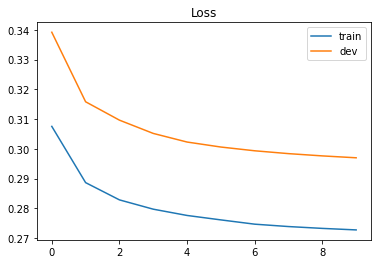

Text(0.5, 1.0, 'Accuracy')

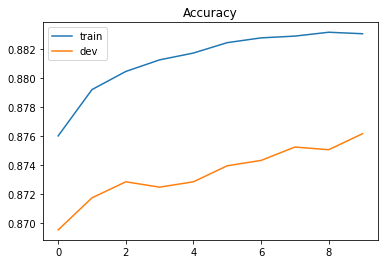

In [7]:
import matplotlib.pyplot as plt

# Loss curve
plt.plot(train_loss)
plt.plot(dev_loss)
plt.title('Loss')
plt.legend(['train', 'dev'])
plt.savefig('loss.png')
plt.show()

# Accuracy curve
plt.plot(train_acc)
plt.plot(dev_acc)
plt.title('Accuracy')
plt.legend(['train', 'dev'])
plt.savefig('acc.png')
plt.show()

In [8]:
# Parse csv files to numpy array
with open(X_train_fpath) as f:
    next(f)
    X_train = np.array([line.strip('\n').split(',')[1:] for line in f], dtype = float)
with open(Y_train_fpath) as f:
    next(f)
    Y_train = np.array([line.strip('\n').split(',')[1] for line in f], dtype = float)
with open(X_test_fpath) as f:
    next(f)
    X_test = np.array([line.strip('\n').split(',')[1:] for line in f], dtype = float)

# Normalize training and testing data
X_train, X_mean, X_std = _normalize(X_train, train = True)
X_test, _, _= _normalize(X_test, train = False, specified_column = None, X_mean = X_mean, X_std = X_std)

'id,age, Private, Self-employed-incorporated, State government, Self-employed-not incorporated, Not in universe, Without pay, Federal government, Never worked, Local government, 10, 11, 38, 13, 14, 15, 16, 17, 32, 33, 30, 31, 36, 37, 34, 35, 39, 23, 48, 50, 18, 19, 42, 25, 24, 12, 26, 21, 20, 49, 22, 47, 29, 45, 44, 43, 28, 41, 40, 2, 3, 0, 1, 6, 7, 4, 5, 8, 9, 46, 51, 27, 10, 11, 12, 39, 14, 15, 16, 17, 32, 19, 30, 31, 36, 38, 34, 35, 13, 9, 18, 33, 42, 25, 24, 27, 26, 21, 20, 23, 22, 43, 45, 44, 29, 28, 41, 37, 2, 3, 0, 1, 6, 7, 4, 5, 8, 40, 46, 1st 2nd 3rd or 4th grade, 12th grade no diploma, Less than 1st grade, Some college but no degree, Masters degree(MA MS MEng MEd MSW MBA), 7th and 8th grade, 11th grade, Bachelors degree(BA AB BS), Prof school degree (MD DDS DVM LLB JD), Associates degree-academic program, 5th or 6th grade, Doctorate degree(PhD EdD), Associates degree-occup /vocational, High school graduate, Children, 10th grade, 9th grade,wage per hour, Not in universe, Colle

'id,label\n'

'id,age, Private, Self-employed-incorporated, State government, Self-employed-not incorporated, Not in universe, Without pay, Federal government, Never worked, Local government, 10, 11, 38, 13, 14, 15, 16, 17, 32, 33, 30, 31, 36, 37, 34, 35, 39, 23, 48, 50, 18, 19, 42, 25, 24, 12, 26, 21, 20, 49, 22, 47, 29, 45, 44, 43, 28, 41, 40, 2, 3, 0, 1, 6, 7, 4, 5, 8, 9, 46, 51, 27, 10, 11, 12, 39, 14, 15, 16, 17, 32, 19, 30, 31, 36, 38, 34, 35, 13, 9, 18, 33, 42, 25, 24, 27, 26, 21, 20, 23, 22, 43, 45, 44, 29, 28, 41, 37, 2, 3, 0, 1, 6, 7, 4, 5, 8, 40, 46, 1st 2nd 3rd or 4th grade, 12th grade no diploma, Less than 1st grade, Some college but no degree, Masters degree(MA MS MEng MEd MSW MBA), 7th and 8th grade, 11th grade, Bachelors degree(BA AB BS), Prof school degree (MD DDS DVM LLB JD), Associates degree-academic program, 5th or 6th grade, Doctorate degree(PhD EdD), Associates degree-occup /vocational, High school graduate, Children, 10th grade, 9th grade,wage per hour, Not in universe, Colle

In [22]:
list(zip(X_train, Y_train))

X_train_0 = np.array([x for x, y in zip(X_train, Y_train) if y == 0])
X_train_1 = np.array([x for x, y in zip(X_train, Y_train) if y == 1])

mean_0 = np.mean(X_train_0, axis = 0)
mean_1 = np.mean(X_train_1, axis = 0)  

# Compute in-class covariance
cov_0 = np.zeros((data_dim, data_dim))
cov_1 = np.zeros((data_dim, data_dim))

for x in X_train_0:
    cov_0 += np.dot(np.transpose([x - mean_0]), [x - mean_0]) / X_train_0.shape[0]
for x in X_train_1:
    cov_1 += np.dot(np.transpose([x - mean_1]), [x - mean_1]) / X_train_1.shape[0]

# Shared covariance is taken as a weighted average of individual in-class covariance.
cov = (cov_0 * X_train_0.shape[0] + cov_1 * X_train_1.shape[0]) / (X_train_0.shape[0] + X_train_1.shape[0])

[(array([-4.27552973e-01,  9.99594577e-01, -1.82240096e-01, -1.77875770e-01,
         -2.54647480e-01, -6.46109078e-01, -3.03711459e-02, -1.57603834e-01,
         -4.56844045e-02, -2.39701735e-01, -4.29318007e-03, -1.17912769e-01,
         -1.01104546e-01, -8.54183061e-02, -5.12258612e-02, -6.35153279e-02,
         -6.88530272e-02, -3.32729937e-02, -1.67867269e-01, -3.46772355e-01,
         -1.00451367e-01, -9.94166224e-02, -7.70256842e-02, -1.72000649e-01,
          6.65782577e+00, -1.65060633e-01, -1.36820459e-01, -6.49617792e-02,
         -6.49617792e-02, -1.16701725e-01, -5.81748453e-02, -9.32782053e-02,
         -1.89562276e-01, -9.85622528e-02, -1.04491982e-01, -1.04130863e-01,
         -3.35494324e-02, -5.75334139e-02, -1.96774856e-02, -7.38124443e-02,
         -7.88212611e-02, -1.16376767e-01, -1.77157686e-01, -1.96597967e-01,
         -1.27134436e-01, -2.49686510e-01, -2.91299046e-02, -1.68793564e-01,
         -1.04851911e-01, -1.16132484e-01, -6.93914267e-02, -6.49348825e-01,

In [23]:
# Compute inverse of covariance matrix.
# Since covariance matrix may be nearly singular, np.linalg.inv() may give a large numerical error.
# Via SVD decomposition, one can get matrix inverse efficiently and accurately.
u, s, v = np.linalg.svd(cov, full_matrices=False)
inv = np.matmul(v.T * 1 / s, u.T)

# Directly compute weights and bias
w = np.dot(inv, mean_0 - mean_1)
b =  (-0.5) * np.dot(mean_0, np.dot(inv, mean_0)) + 0.5 * np.dot(mean_1, np.dot(inv, mean_1))\
    + np.log(float(X_train_0.shape[0]) / X_train_1.shape[0]) 

# Compute accuracy on training set
Y_train_pred = 1 - _predict(X_train, w, b)
print('Training accuracy: {}'.format(_accuracy(Y_train_pred, Y_train)))

Training accuracy: 0.8731753170156296


In [ ]:
# Predict testing labels
predictions = 1 - _predict(X_test, w, b)
with open(output_fpath.format('generative'), 'w') as f:
    f.write('id,label\n')
    for i, label in  enumerate(predictions):
        f.write('{},{}\n'.format(i, label))

# Print out the most significant weights
ind = np.argsort(np.abs(w))[::-1]
with open(X_test_fpath) as f:
    content = f.readline().strip('\n').split(',')
features = np.array(content)
# for i in ind[0:10]:
#     print(features[i], w[i])


9

4

4

4

4

4

4

4

4

4

4

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

5

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

6

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

7

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8

8